In [140]:
import pandas as pd
import numpy as np

In [141]:
df=pd.read_csv("https://raw.githubusercontent.com/aastha12/Machine-Learning/master/Regression/Linear%20Regression/housing.csv")

In [142]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [143]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


25% of districts have housing_median_age lowes than 18, 50% have it lower than 29 and 75% have it lower than 37.

In [144]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

## Plot Median House Value and Population using Plotly and Mapbox

Source: https://plotly.com/python/scattermapbox/

In [145]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [146]:
px.set_mapbox_access_token(open(r"C:\Users\aasth\Desktop\Data analytics\Data Science\Machine Learning\ML algos - Github\mapbox access token.txt").read())

In [147]:
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude",     color="median_house_value", size=df["population"],
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=4.5)

fig.update_layout(title_text="California Housing Pricing (Median)")
fig.show()

## Plot histogram for numerical values using Plotly

In [148]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [149]:
dfplot = df.select_dtypes(exclude="object") # selecting the numerical columns

fig = make_subplots(rows=3, cols=3, subplot_titles=(dfplot.columns)) #creating 9 subplots


index=0
for i in range(1,4):
    for j in range(1,4):
        #dfplot.columns[3] gives 'total_rooms' and dfplot['total_rooms'] will select that column
        data = dfplot[dfplot.columns[index]]
        trace = go.Histogram(x=data)
        fig.append_trace(trace, i, j) #appending the histogram "trace" at row i and column j
        index+=1
        
    
fig.update_layout(height=900, width=1250, title_text="Numerical Attributes")
fig.show()

2 main observations:

1. Different scales. Feature scaling will be necessary
2. Tail Heavy: They extend much farther to the right of the median than left. This distribution may make it a bit harder to detect pattern. It's easier with a bell-shaped or gaussian-shaped distributoin

In [150]:
#writing above code as a function to plot histogram for numerical columns

def plot_num_hist(df):
    dfplot = df.select_dtypes(exclude="object") # selecting the numerical columns

    fig = make_subplots(rows=2, cols=4, subplot_titles=(dfplot.columns)) #creating 8 subplots


    index=0
    for i in range(1,3):
        for j in range(1,5):
            #dfplot.columns[3] gives 'total_rooms' and dfplot['total_rooms'] will select that column
            data = dfplot[dfplot.columns[index]]
            trace = go.Histogram(x=data)
            fig.append_trace(trace, i, j) #appending the histogram "trace" at row i and column j
            index+=1
        
    
    fig.update_layout(height=900, width=1250, title_text=("Numerical Attributes"))
    fig.show()

## Missing Values

In [151]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

We will fill the missing values with mean/median depending on whether there are any outliers in the "total_bedrooms" column

In [152]:
fig = px.box(df, y="total_bedrooms")
fig.show()

Because there are so many outliers, we will fill the missing values with median.

In [153]:
df['total_bedrooms'].fillna(df['total_bedrooms'].median(),inplace=True)
df.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

## Outlier Detection and Treatment

Source: https://www.pluralsight.com/guides/cleaning-up-data-from-outliers

### Outlier Detection:

1. .describe() method
2. IQR mthod
3. Skweness value
4. Visualizations

### Outlier Treatment:

1. Quantile-based Flooring and Capping -we will do the flooring (e.g., the 10th percentile) for the lower values  and capping (e.g., the 90th percentile) for the higher values. So replace value lower than 10th percentile with the 10th percentile value
    and replace values higher than 90th percentile with 90th percentile value

2. Trimming - remove all outliers

3. IQR score - anything not in the range of (Q1 - 1.5 IQR) and (Q3 + 1.5 IQR) is an outlier, and can be removed

4. Log Transformation - Transformation of the skewed variables may also help correct the distribution of the variables. These could be logarithmic, square root, or square transformations. 

5. Replacing Outliers with Median Values

In [154]:
def detect_treat_outliers(df):
    
    Q1=df.quantile(0.25)
    Q3=df.quantile(0.75)
    IQR=Q3-Q1
    
    df_out = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
        
    return df_out

In [155]:
df.shape

(20640, 10)

In [156]:
'''
Skewness value explains the extent to which the data is normally distributed. 
Ideally, the skewness value should be between -1 and +1, and any major deviation from 
this range indicates the presence of extreme values.
'''

print("Skewness of dataframe before treating outliers:",df.skew())
df=detect_treat_outliers(df)
print("Shape of dataframe after treating outliers:",df.skew())

Skewness of dataframe before treating outliers: longitude            -0.297801
latitude              0.465953
housing_median_age    0.060331
total_rooms           4.147343
total_bedrooms        3.481141
population            4.935858
households            3.410438
median_income         1.646657
median_house_value    0.977763
dtype: float64
Shape of dataframe after treating outliers: longitude            -0.268725
latitude              0.429243
housing_median_age    0.013163
total_rooms           0.663883
total_bedrooms        0.635972
population            0.623995
households            0.586066
median_income         0.567187
median_house_value    0.766829
dtype: float64


Much better skewness value

## One Hot Encoding of Categorial Features


You need to apply one-hot-encoding before you split your data. Otherwise you will run into problems if there is a categorical attribute whose values are not all present in the train and test data. 

Source: https://datascience.stackexchange.com/questions/63680/binary-classification-one-hot-encoding-preventing-me-using-test-set#:~:text=You%20need%20to%20apply%20one,the%20train%20and%20test%20data.&text=As%20you%20can%20see%20the,data%20do%20not%20match%20anymore.

In [157]:
df.head(2)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY


In [158]:
one_hot_df=pd.get_dummies(df["ocean_proximity"])

df=pd.concat([df,one_hot_df],axis=1)
df.drop(['ocean_proximity'],axis=1,inplace=True)
df.head(2)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0


## Train/Test split

In the interest of preventing information about the distribution of the test set leaking into your model, you should fit the scaler on your training data only, then standardise both training and test sets with that scaler. For this reason, we will first perform train/test split and then feature scaling.

In [159]:
from sklearn.model_selection import train_test_split

X=df.copy()
X.drop(['median_house_value'],inplace=True,axis=1)

y=df[['median_house_value']]

X=np.array(X)
y=np.array(y)

X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.25)
print("Shape of training set features:",X_train.shape)
print("Shape of training set labels:",y_train.shape)
print("Shape of testing set features:",X_test.shape)
print("Shape of testing set labels:",y_test.shape)

Shape of training set features: (13206, 13)
Shape of training set labels: (13206, 1)
Shape of testing set features: (4403, 13)
Shape of testing set labels: (4403, 1)


In [160]:
y_train=y_train.ravel()
y_test=y_test.ravel()
print("Shape of training set labels:",y_train.shape)
print("Shape of testing set labels:",y_test.shape)

Shape of training set labels: (13206,)
Shape of testing set labels: (4403,)


## Feature Scaling

We need to scale the one hot encoded columns as well. Once converted to numerical form, models don't respond differently to columns of one-hot-encoded than they do to any other numerical data. So there is a clear precedent to normalise the {0,1} values if you are doing it for any reason to prepare other columns.

Source: https://datascience.stackexchange.com/questions/31652/should-one-hot-vectors-be-scaled-with-numerical-attributes

### Scale vs Standardize vs Normalize

Source: https://towardsdatascience.com/scale-standardize-or-normalize-with-scikit-learn-6ccc7d176a02

- <b>Scale:</b> generally means to change the <b>range of the values</b>. The shape of the distribution doesn’t change. Think about how a scale model of a building has the same proportions as the original, just smaller. That’s why we say it is drawn to scale. The range is often set at 0 to 1.

- <b>Standardize:</b> generally means changing the values so that the distribution standard deviation from the mean equals one. It <b>outputs something very close to a normal distribution</b>. Scaling is often implied.

- <b>Normalize:</b> can be used to mean either of the above things (and more!). I suggest you avoid the term normalize, because it has many definitions and is prone to creating confusion.

### Why Scale, Standardize, or Normalize?

Many machine learning algorithms perform better or converge faster when features are on a relatively similar scale and/or close to normally distributed. Examples of such algorithm families include:

- linear and logistic regression
- nearest neighbors
- neural networks
- support vector machines with radial bias kernel functions
- principal components analysis
- linear discriminant analysis

### Different types of scalers, transformers and normalizers:

Source: https://scikit-learn.org/stable/auto_examples/preprocessing/plot_all_scaling.html

1. Standard Scaler - StandardScaler removes the mean and scales the data to unit variance. However, the outliers have an influence when computing the empirical mean and standard deviation. StandardScaler therefore cannot guarantee balanced feature scales in the presence of outliers.

Formula:
<img src="https://cdn-images-1.medium.com/max/800/0*vQEjz0mvylP--30Q.GIF" width=200>

2. MinMaxScaler - rescales the data set such that all feature values are in the range [0, 1] as shown in the right panel below. However, this scaling compress all inliers in the narrow range [0, 0.005] for the transformed number of households.
MinMaxScaler is very sensitive to the presence of outliers.

Formula:
<img src="https://qph.fs.quoracdn.net/main-qimg-0d692d88876aeb26b1f1a578d1c5a94e.webp" width=400>


3. RobustScaler - RobustScaler transforms the feature vector by subtracting the median and then dividing by the interquartile range (75% value — 25% value).

Formula: 

<img src="https://www.geeksforgeeks.org/wp-content/ql-cache/quicklatex.com-a0e5e6009162975eb87a7a172a8f546e_l3.svg" width=200>

4. PowerTransformer - PowerTransformer applies a power transformation to each feature to make the data more Gaussian-like. Currently, PowerTransformer implements the Yeo-Johnson and Box-Cox transforms. The power transform finds the optimal scaling factor to stabilize variance and mimimize skewness through maximum likelihood estimation. Sometimes a lift in performance can be achieved by first standardizing the raw dataset prior to performing a Yeo-Johnson transform.(set 'standardize'=True)

Source: https://machinelearningmastery.com/power-transforms-with-scikit-learn/

Box Cox:
<img src="https://wikimedia.org/api/rest_v1/media/math/render/svg/b565ae8f1cce1e4035e2a36213b8c9ce34b5029d" width=200>

Yeo-johnson:
<img src="https://wikimedia.org/api/rest_v1/media/math/render/svg/6210e6c069595e7c1d139f414c4b0fc48ee0b12c" width=500>


Summarized the important ones:

Source-https://towardsdatascience.com/scale-standardize-or-normalize-with-scikit-learn-6ccc7d176a02

<img src="https://miro.medium.com/max/2551/1*z-C9ANBC4rjsk-ZK4wzijg.png" width=1000>

### Should we standardize/scale/transform before or after splitting the data into train-test split?

Standardize after splitting into train-test

<b>Why?</b>

Source: https://datascience.stackexchange.com/questions/38395/standardscaler-before-and-after-splitting-data

In the interest of preventing information about the distribution of the test set leaking into your model, you should fit the scaler on your training data only, then standardise both training and test sets with that scaler. By fitting the scaler on the full dataset prior to splitting, information about the test set is used to transform the training set, which in turn is passed downstream.

As an example, knowing the distribution of the whole dataset might influence how you detect and process outliers, as well as how you parameterise your model. Although the data itself is not exposed, information about the distribution of the data is. As a result, your test set performance is not a true estimate of performance on unseen data.

In [161]:
#Just check with Robust Scaler to see the output

#from sklearn.preprocessing import RobustScaler

#we have to scale the numerical attributes
#rb=RobustScaler(with_centering=True)
#df_robust_scaled=rb.fit_transform(df.select_dtypes(exclude='object'))
#df_robust_scaled=pd.DataFrame(df_robust_scaled,columns=df.select_dtypes(exclude='object').columns)
#df_robust_scaled.head(2)
#plotting histogram of scaled dataframe
#plot_num_hist(df_robust_scaled)

In [162]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', '<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY',
       'NEAR OCEAN'],
      dtype='object')

In [163]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
<1H OCEAN               uint8
INLAND                  uint8
ISLAND                  uint8
NEAR BAY                uint8
NEAR OCEAN              uint8
dtype: object

In [164]:
#del pt

In [165]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson',standardize=True)
#you can get the original data back using inverse_transform(X)

X_train=pt.fit_transform(X_train)

#fit the model only on the train set and transform the test set
X_test=pt.transform(X_test)

training_columns=['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households','median_house_value', '<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY',
       'NEAR OCEAN']

X_train_power_scaled=pd.DataFrame(X_train,columns=training_columns)

#create a dataframe from power transformed X_test set
X_test_power_scaled=pd.DataFrame(X_test,columns=training_columns)

X_train_power_scaled.head(2)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
0,1.247804,-0.678933,0.313332,0.730425,0.171890,0.184197,0.175685,1.135371,-0.87345,1.40869,-0.012307,-0.344497,-0.379566
1,1.487449,-1.657225,-1.187234,-1.229648,-1.043798,-0.414942,-0.960981,-1.717138,-0.87345,-0.70988,-0.012307,-0.344497,2.634591


In [166]:
plot_num_hist(X_train_power_scaled)

We will use the power transformed dataset.

## Checking if assumptions of Linear Regression are met

Source: https://jeffmacaluso.github.io/post/LinearRegressionAssumptions/

#### 1. Linearity of the model: 
The response variable y should be a linearly related to the explanatory variables X.
#### 2. Normality of error terms:
This assumes that the error terms of the model are normally distributed.
#### 3. No (perfect) multicollinearity:
The independent variables should not be correlated. Absence of this phenomenon is known as multicollinearity.
#### 4. Residual errors should be homoscedastic: 
The residual errors should have constant variance.
#### 5. No Autocorrelation of the Error Terms
There should be no correlation between the residual (error) terms. Absence of this phenomenon is known as Autocorrelation.

### 1. Linearity of the model

Use a scatter plot to see our predicted values versus the actual values (in other words, view the residuals). Ideally, the points should lie on or around a diagonal line on the scatter plot.

Before we check that, let's write a function to calculate the residuals of a baseline linear regression model.

In [199]:
print(X_train.shape,y_train.shape)

(13206, 13) (13206,)


In [201]:
#del LR,LR2

In [202]:
#Fitting baseline LR model

from sklearn.linear_model import LinearRegression
LR=LinearRegression()
LR.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [203]:
def calculate_residuals(LR,feature,label):
    
    yhat=LR.predict(feature)
    residuals=abs(yhat-label)
    df_results=pd.DataFrame({'Actual':label,'Predicted':yhat,'Residuals':residuals})
    return df_results


In [204]:
import plotly.graph_objects as go

df_residuals=calculate_residuals(LR,X_train,y_train)
fig = px.scatter(df_residuals, x="Actual", y="Predicted")
fig.update_layout(title='Actual vs Predicted on Training data')
fig.show()

Not a strong linear relationship. We can add polynomial transformations to add additional polynomial features.

Before we apply ploynomial transformation, we need to check the R^2 value.

#### R-Squared
It is important to know how well the relationship between the values of the x- and y-axis is, if there are no relationship the polynomial regression can not be used to predict anything.

The relationship is measured with a value called the r-squared.

The r-squared value ranges from 0 to 1, where 0 means no relationship, and 1 means 100% related.

In [205]:
LR.score(X_train,y_train) #returns R^2 score value by default

0.5998271467695739

Since the R^2 value is 0.59, which is not very high but let's proceed with polynomial transformation.

#### Polynomial Transformation

In [220]:
#del X_poly,fig,df_residuals,LR2

In [221]:
from sklearn.preprocessing import PolynomialFeatures 
  
poly = PolynomialFeatures(degree = 4) 
X_poly = poly.fit_transform(X_train) 
  
LR2 = LinearRegression() 
LR2.fit(X_poly, y_train) 

df_residuals=calculate_residuals(LR2,X_poly,y_train)
fig = px.scatter(df_residuals, x="Actual", y="Predicted")
fig.update_layout(title='Actual vs Predicted on Training data')
fig.show()

The line seems to be somewhat linear now

In [222]:
LR2.score(X_poly,y_train) #returns R^2 score value by default

0.80262891969967

### 2. Normality of error terms

In [223]:
#calculate the residuals
df_residuals=calculate_residuals(LR2,X_poly,y_train) #remmeber the new model is now LR2 and X_poly is the new feature set
fig = px.histogram(df_residuals['Residuals'])
fig.show()

In [224]:
from statsmodels.stats.diagnostic import normal_ad
print('Using the Anderson-Darling test for normal distribution')

# Performing the test on the residuals
p_value = normal_ad(df_residuals['Residuals'])[1]
print('p-value from the test - below 0.05 generally means non-normal:', p_value)
    
# Reporting the normality of the residuals
if(p_value < 0.05):
    print('Residuals are not normally distributed')
else:
    print('Residuals are normally distributed')

Using the Anderson-Darling test for normal distribution
p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\stats\_adnorm.py:67: RuntimeWarning:

divide by zero encountered in log



The residuals are tail heavy. We have already performed non linear transformations on the dataset but despite of that we are getting tail heavy distribution. 

Another reason for non-normality of error terms could be due to the precense of outliers. We had removed outliers as well.

This will affect the confidence intervals.

### 3. No (perfect) multicollinearity:

We can detect multicollinearity using the variance inflation factor (VIF).

The Variance Inflation Factor (VIF) is a measure of colinearity among predictor variables within a multiple regression. It is calculated by taking the the ratio of the variance of all a given model's betas divide by the variane of a single beta if it were fit alone

<img src="https://blog.minitab.com/hubfs/Imported_Blog_Media/capture2.png">

There are some guidelines we can use to determine whether our VIFs are in an acceptable range. A rule of thumb commonly used in practice is if a VIF is > 10, you have high multicollinearity.

In [225]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X_poly_df=pd.DataFrame(X_poly) #converting to df as vif requires(value, column index)-https://www.statsmodels.org/stable/generated/statsmodels.stats.outliers_influence.variance_inflation_factor.html
X_poly_df.shape
#vif=[variance_inflation_factor(X_poly_df.values,i) for i in range(X_poly_df.shape[1])]

(13206, 2380)

Since we have 2380 column, VIF and corr() both raise MemoryError. We need to perform PCA for dimensionality reduction.

#### PCA

Source: https://github.com/mGalarnyk/Python_Tutorials/blob/master/Sklearn/PCA/PCA_to_Speed-up_Machine_Learning_Algorithms.ipynb

In [226]:
from sklearn.decomposition import PCA

In [285]:
pca = PCA(n_components=400)

In [286]:
pca.fit(X_poly)

PCA(copy=True, iterated_power='auto', n_components=400, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [287]:
pca.n_components_

400

In [288]:
pca.explained_variance_ratio_[:3]

array([9.99951414e-01, 4.85507258e-05, 7.88103724e-09])

In [289]:
X_poly_pca=pca.transform(X_poly)

In [290]:
X_poly_pca.shape

(13206, 400)

In [291]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X_poly_df=pd.DataFrame(X_poly_pca) #converting to df as vif requires(value, column index)-https://www.statsmodels.org/stable/generated/statsmodels.stats.outliers_influence.variance_inflation_factor.html
X_poly_df.shape
vif=[variance_inflation_factor(X_poly_df.values,i) for i in range(X_poly_df.shape[1])]

In [292]:
for v in vif:
    if v>5:
        print("Multicollinearity")

All the VIF values are below 5 so multicollinearity is not present.

### 4. Residuals should be homoscedastic

Source: https://towardsdatascience.com/verifying-the-assumptions-of-linear-regression-in-python-and-r-f4cd2907d4c0

This assumes homoscedasticity, which is the same variance within our error terms. Heteroscedasticity, the violation of homoscedasticity, occurs when we don’t have an even variance across the error terms.

To investigate if the residuals are homoscedastic, we can look at a plot of residuals (or standardized residuals) vs. predicted (fitted) values. What should alarm us is the case when the residuals grow either as a function of predicted value or time (in case of time series).

In [293]:
#Remember our new training set is X_poly_pca and y_train(labels). We need to fit a new LR model to this dataset
X_poly_pca.shape,y_train.shape

((13206, 400), (13206,))

In [294]:
LR3 = LinearRegression() 
LR3.fit(X_poly_pca, y_train)
df_residuals=calculate_residuals(LR3,X_poly_pca,y_train)
fig = px.scatter(df_residuals, x="Predicted", y="Residuals",trendline="ols")
fig.update_layout(title='Residuals vs Predicted on Training data')
fig.show()

To identify homoscedasticity in the plots, the placement of the points should be random and no pattern (increase/decrease in values of residuals) should be visible — the red line in the left plot (just an example) should be flat. 
<img src="https://miro.medium.com/max/945/1*MJpbpTM0SWrj-0yB-Kecew.png" width=500>

We can see that this is the case for our dataset. The line is almost flat.

We can also use two statistical tests: Breusch-Pagan and Goldfeld-Quandt. In both of them, the null hypothesis assumes homoscedasticity and a p-value below a certain level (like 0.05) indicates we should reject the null in favor of heteroscedasticity.

### 5. No autocorrelation of error terms:

Source: https://towardsdatascience.com/verifying-the-assumptions-of-linear-regression-in-python-and-r-f4cd2907d4c0

This assumption is especially dangerous in time-series models, where serial correlation in the residuals implies that there is room for improvement in the model.

It means that the model systematically underpredicts/overpredicts what happens when the predictors have a particular configuration.

To investigate if autocorrelation is present, we will use ACF (autocorrelation function) plots. We want to see if the value of ACF is significant for any lag (in case of no time-series data, the row number is used).

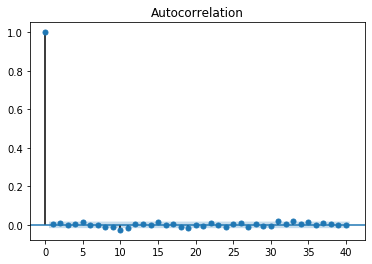

In [295]:
import statsmodels.tsa.api as smt

df_residuals=calculate_residuals(LR3,X_poly_pca,y_train)
acf = smt.graphics.plot_acf(df_residuals.Residuals, lags=40 , alpha=0.05)

No major autocorrelation.

Our model (LR2) can be for prediction as it satisfies most of the assumptions of linear regression(it didn't satisfy the normality of errors assumption which will cause problems with calculating confidence intervals and various significance tests for coefficients) . Remember we trained our model on the training set and got the residuals based on the training set itself. 

Now let's use the model to predict the test set and check the error.

Before that, 

1. Add Polynomial Features to test set - we applied polynomial transformation to X_train which we need to perform on X_test

2. Using the fitted PCA, we need to reduce the features on X_test 

In [296]:
X_poly_test = poly.transform(X_test)
X_test_pca=pca.transform(X_poly_test)

In [297]:
X_test_pca.shape,X_poly_pca.shape

((4403, 400), (13206, 400))

In [298]:
yhat=LR3.predict(X_test_pca)

In [299]:
from sklearn.metrics import r2_score
print("R2 score for test set:",r2_score(y_test,yhat)) #(y_true, y_pred)
print("R2 score for training set:",r2_score(y_train,LR3.predict(X_poly_pca)))

R2 score for test set: 0.7231151127976991
R2 score for training set: 0.7479640069884949


In [300]:
from sklearn.metrics import mean_squared_error
#mean_squared_error(y_true, y_pred) 

print("MSE for test set:",mean_squared_error(y_test,yhat))
print("RMSE for test set:",np.sqrt(mean_squared_error(y_test,yhat)))

MSE for test set: 2512569869.8482375
RMSE for test set: 50125.5410928225


In [302]:
dictionary={'Predicted House Value':yhat,'Actual House Value':y_test}
final_predictions=pd.DataFrame(dictionary)
final_predictions.head(5)

,Predicted House Value,Actual House Value
0,224752.557602,164800.0
1,297078.188248,361300.0
2,261988.835470,351200.0
3,203533.111255,232100.0
4,240217.327148,215400.0


In [310]:
px.scatter(final_predictions,x='Actual House Value',y='Predicted House Value')